<a href="https://colab.research.google.com/github/Aravindh4404/FYPSeagullClassification01/blob/main/VIT2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
!pip install timm


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 51.6/51.6 kB 1.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 25.4 MB/s eta 0:00:00


In [ ]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, random_split
import numpy as np
import random
import matplotlib.pyplot as plt
from datetime import datetime
import timm  # For using pretrained Vision Transformer models
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

# Set random seeds for reproducibility
torch.manual_seed(42)
np.random.seed(42)
random.seed(42)

# Mount Google Drive to save and load the model (if using Google Colab)
from google.colab import drive
drive.mount('/content/drive')

# Define the folder to save model checkpoints
date_str = datetime.now().strftime('%Y%m%d')
checkpoint_folder = f'/content/drive/My Drive/FYP/VIT2_HQ2_{date_str}/'
os.makedirs(checkpoint_folder, exist_ok=True)

# Data Augmentation for Training Set
transform_train = transforms.Compose([
    transforms.Resize((224, 224)),  # Typical input size for ViT models
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5]),  # Normalize to match pretrained models' expectations
])

# Simple resizing for validation and test sets
transform_val_test = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5]),  # Normalize to match pretrained models' expectations
])

# Load datasets
data_path = '/content/drive/My Drive/FYP/Dataset/HQ2/train'
test_data_path = '/content/drive/My Drive/FYP/Dataset/HQ2/test'
train_dataset = datasets.ImageFolder(data_path, transform=transform_train)
test_dataset = datasets.ImageFolder(test_data_path, transform=transform_val_test)

# Split the dataset into 80% training and 20% validation
train_size = int(0.8 * len(train_dataset))
val_size = len(train_dataset) - train_size
train_dataset, val_dataset = random_split(train_dataset, [train_size, val_size])

# Create data loaders
batch_size = 16
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Set the device to GPU if available, otherwise CPU
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


# Use Pre-trained Vision Transformer (ViT) model and modify it for binary classification
class ViTModified(nn.Module):
    def __init__(self):
        super(ViTModified, self).__init__()
        self.vit = timm.create_model('vit_base_patch16_224', pretrained=True)
        num_ftrs = self.vit.head.in_features
        self.vit.head = nn.Linear(num_ftrs, 2)  # Modify the classifier to output 2 classes

    def forward(self, x):
        return self.vit(x)

# Initialize the ViT model
model = ViTModified().to(device)

# Define loss function and optimizer with L2 regularization (weight decay)
criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.parameters(), lr=0.0001, weight_decay=1e-4)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.1, patience=3, verbose=True)

# Training loop with learning rate scheduler and checkpoint saving
def train(model, train_loader, val_loader, criterion, optimizer, scheduler, epochs=20):
    best_acc = 0.0
    train_losses = []
    val_accuracies = []
    val_precisions = []
    val_recalls = []
    val_f1s = []

    for epoch in range(epochs):
        model.train()
        running_loss = 0.0
        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()

            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()

        # Print the loss per epoch
        train_loss = running_loss / len(train_loader)
        train_losses.append(train_loss)
        print(f"Epoch [{epoch+1}/{epochs}], Loss: {train_loss:.6f}")

        # Validate the model and check metrics
        val_acc, val_precision, val_recall, val_f1 = validate(model, val_loader, criterion)
        val_accuracies.append(val_acc)
        val_precisions.append(val_precision)
        val_recalls.append(val_recall)
        val_f1s.append(val_f1)
        scheduler.step(val_acc)

        # Save checkpoint of the latest model after each epoch
        latest_model_path = os.path.join(checkpoint_folder, f"latest_model_vit_{date_str}.pth")
        torch.save(model.state_dict(), latest_model_path)
        print(f"Checkpoint saved for epoch {epoch + 1} at {latest_model_path}")

        # Save the best model if the accuracy improves
        if val_acc > best_acc:
            best_acc = val_acc
            best_model_path = os.path.join(checkpoint_folder, f"best_model_vit_{date_str}.pth")
            torch.save(model.state_dict(), best_model_path)
            print(f"New best model saved with accuracy: {best_acc:.2f}% at {best_model_path}")

    # Plot training and validation metrics
    plt.figure(figsize=(20, 10))
    plt.subplot(2, 2, 1)
    plt.plot(train_losses, label='Training Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Training Loss')
    plt.grid(True)

    plt.subplot(2, 2, 2)
    plt.plot(val_accuracies, label='Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy (%)')
    plt.title('Validation Accuracy')
    plt.grid(True)

    plt.subplot(2, 2, 3)
    plt.plot(val_precisions, label='Validation Precision')
    plt.xlabel('Epochs')
    plt.ylabel('Precision')
    plt.title('Validation Precision')
    plt.grid(True)

    plt.subplot(2, 2, 4)
    plt.plot(val_recalls, label='Validation Recall')
    plt.xlabel('Epochs')
    plt.ylabel('Recall')
    plt.title('Validation Recall')
    plt.grid(True)

    plt.tight_layout()
    plt.show()

    # Plot F1 score separately
    plt.figure(figsize=(10, 5))
    plt.plot(val_f1s, label='Validation F1 Score')
    plt.xlabel('Epochs')
    plt.ylabel('F1 Score')
    plt.title('Validation F1 Score')
    plt.grid(True)
    plt.show()

    # Save the final model at the end of training
    final_model_path = os.path.join(checkpoint_folder, f"final_model_vit_{date_str}.pth")
    torch.save(model.state_dict(), final_model_path)
    print(f"Final model saved at {final_model_path}")

# Validation loop returning metrics
def validate(model, loader, criterion):
    model.eval()
    correct = 0
    total = 0
    all_labels = []
    all_predictions = []

    with torch.no_grad():
        for inputs, labels in loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            all_labels.extend(labels.cpu().numpy())
            all_predictions.extend(predicted.cpu().numpy())

    accuracy = 100 * correct / total
    precision = precision_score(all_labels, all_predictions, average='binary')
    recall = recall_score(all_labels, all_predictions, average='binary')
    f1 = f1_score(all_labels, all_predictions, average='binary')
    print(f'Validation Accuracy: {accuracy:.2f}%, Precision: {precision:.2f}, Recall: {recall:.2f}, F1 Score: {f1:.2f}')
    return accuracy, precision, recall, f1

# Test function to evaluate on the test set
def test(model, loader, criterion):
    model.eval()
    test_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():
        for inputs, labels in loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            test_loss += loss.item()

            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

    accuracy = 100 * correct / total
    print(f'Test Loss: {test_loss/len(loader):.6f}, Test Accuracy: {accuracy:.2f}%')

# Step 1: Train the model with learning rate scheduling
train(model, train_loader, val_loader, criterion, optimizer, scheduler, epochs=20)

# Step 2: Evaluate the model on the test set
test(model, test_loader, criterion)


Mounted at /content/drive


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


Epoch [1/20], Loss: 0.214581
Validation Accuracy: 98.20%, Precision: 0.98, Recall: 1.00, F1 Score: 0.99
Checkpoint saved for epoch 1 at /content/drive/My Drive/FYP/VIT2_HQ2_20241125/latest_model_vit_20241125.pth
New best model saved with accuracy: 98.20% at /content/drive/My Drive/FYP/VIT2_HQ2_20241125/best_model_vit_20241125.pth
Epoch [2/20], Loss: 0.133064
Validation Accuracy: 98.20%, Precision: 0.99, Recall: 0.99, F1 Score: 0.99
Checkpoint saved for epoch 2 at /content/drive/My Drive/FYP/VIT2_HQ2_20241125/latest_model_vit_20241125.pth
Epoch [3/20], Loss: 0.096899
Validation Accuracy: 98.20%, Precision: 0.99, Recall: 0.99, F1 Score: 0.99
Checkpoint saved for epoch 3 at /content/drive/My Drive/FYP/VIT2_HQ2_20241125/latest_model_vit_20241125.pth
Epoch [4/20], Loss: 0.077407
Validation Accuracy: 95.21%, Precision: 0.96, Recall: 0.99, F1 Score: 0.97
Checkpoint saved for epoch 4 at /content/drive/My Drive/FYP/VIT2_HQ2_20241125/latest_model_vit_20241125.pth
Epoch [5/20], Loss: 0.086375
Val

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


<ipython-input-7-bd33134913c1>:32: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(checkpoint_path, map_location=torch.device('cpu')))


Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Glaucous_Winged_Gull/imageRTEs.jpg


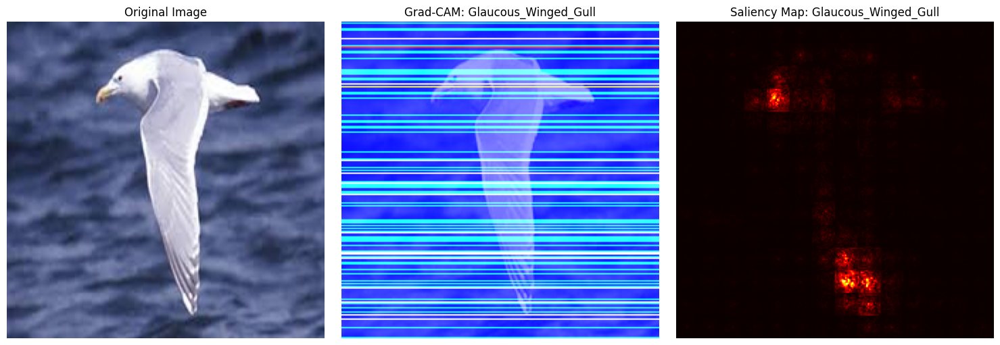

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Glaucous_Winged_Gull/iDFGmages.jpg


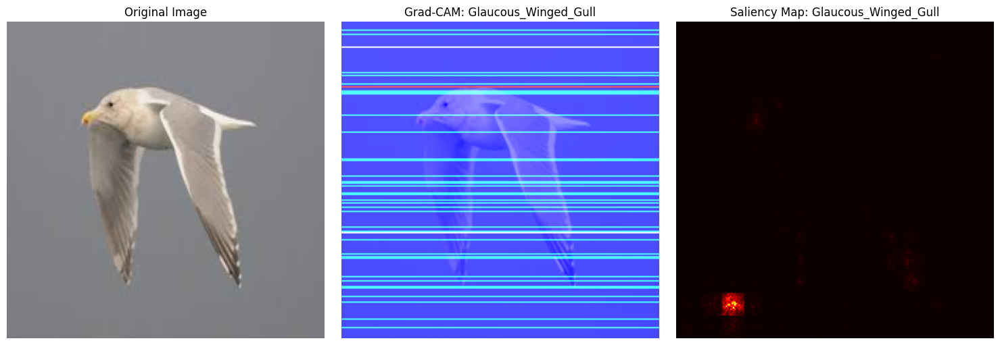

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Glaucous_Winged_Gull/images.jpg


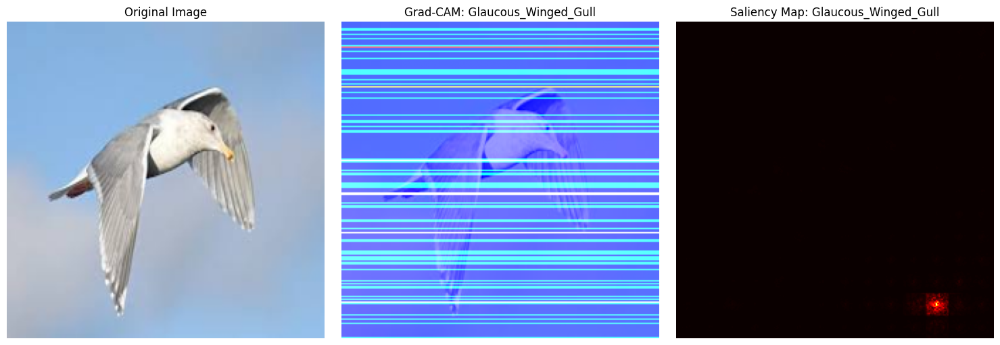

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Glaucous_Winged_Gull/480 (11).jpeg


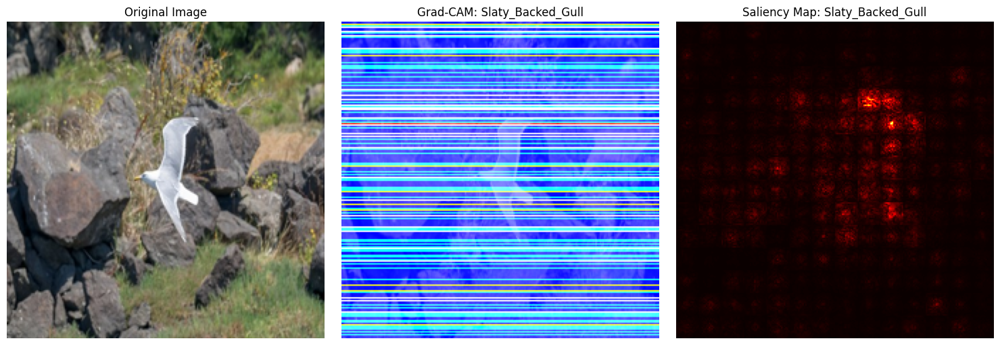

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Glaucous_Winged_Gull/320 (5).jpeg


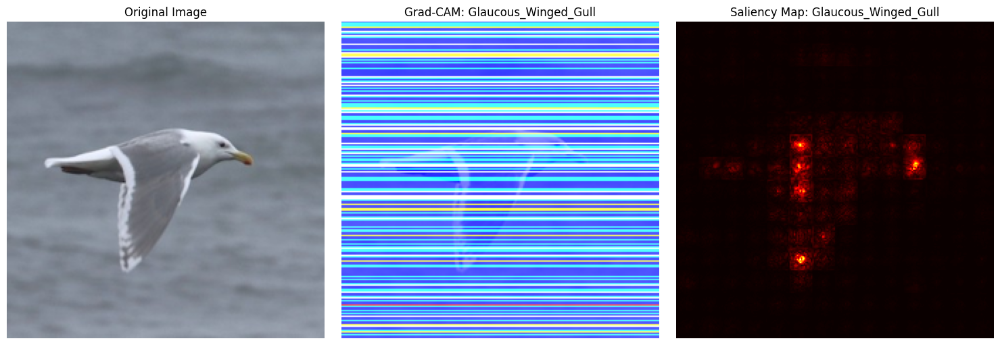

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/480 (14).jpeg


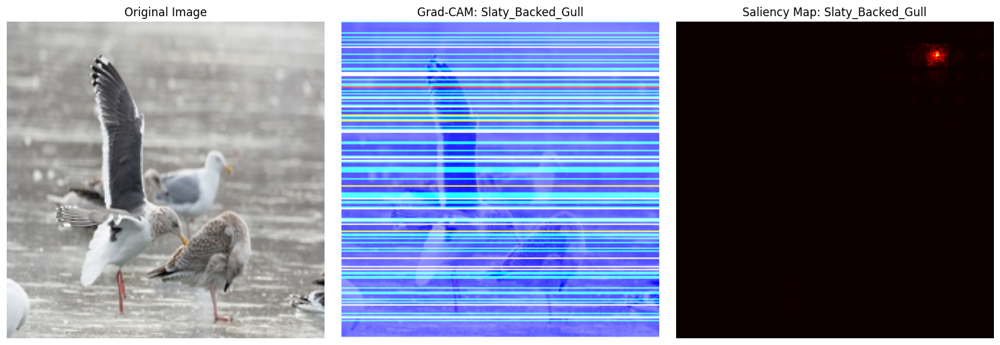

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/480 (34).jpeg


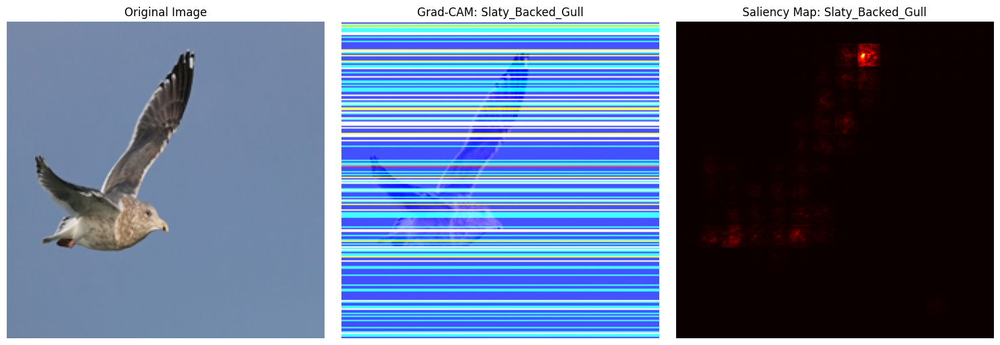

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/480 (42).jpeg


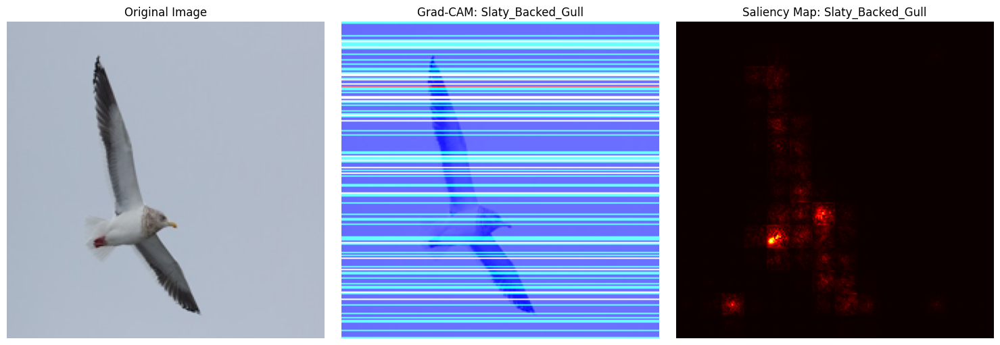

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/480 (52).jpeg


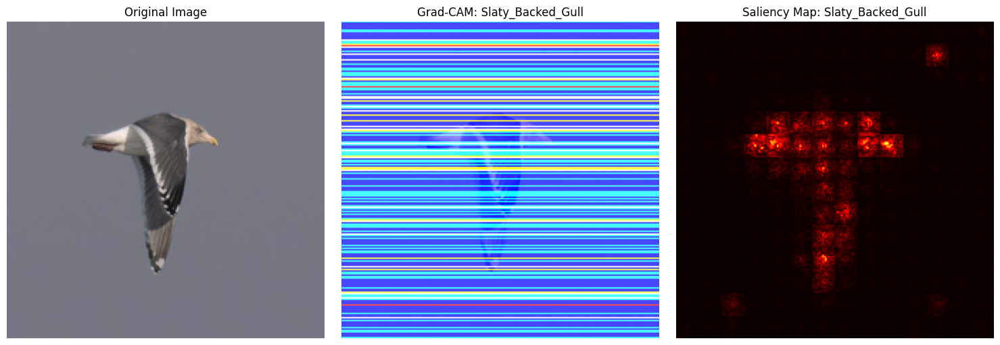

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/480 (10).jpeg


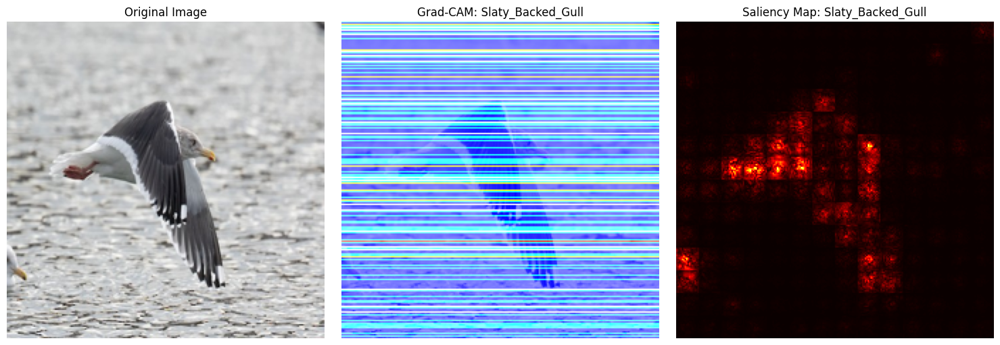

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/480 (28).jpeg


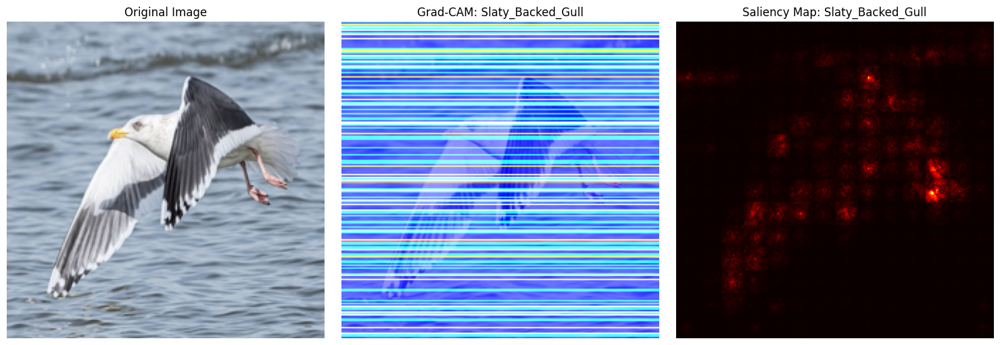

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/480 (49).jpeg


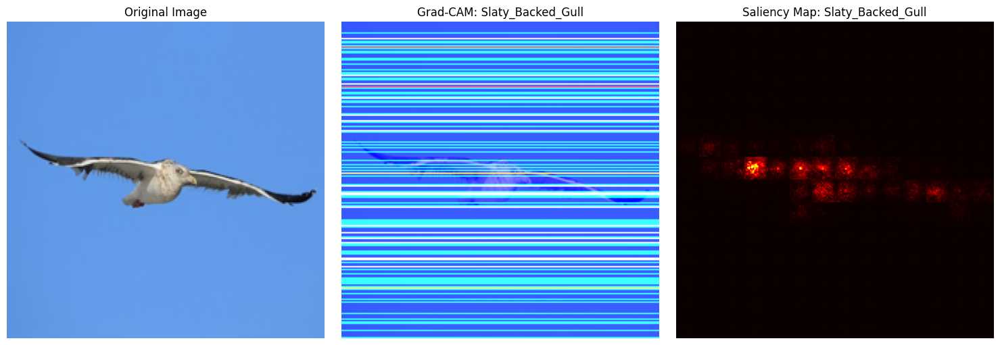

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/007.jpg


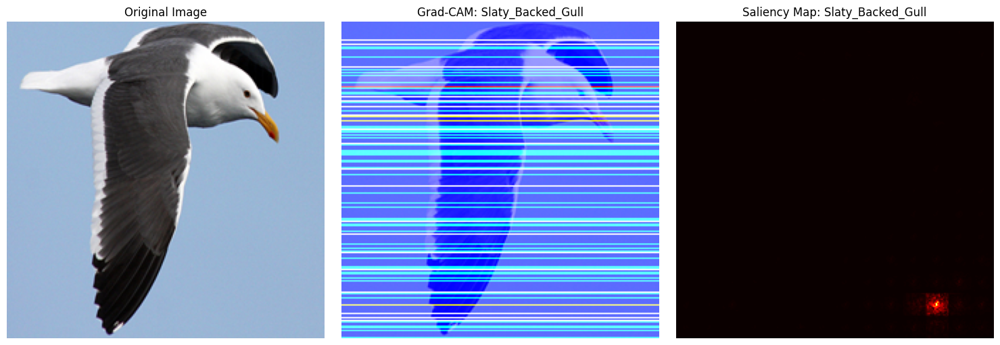

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/480 (3).jpeg


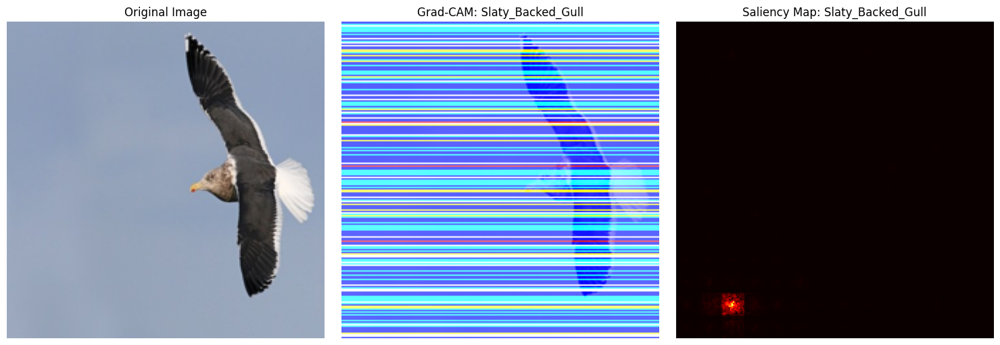

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/480 (32).jpeg


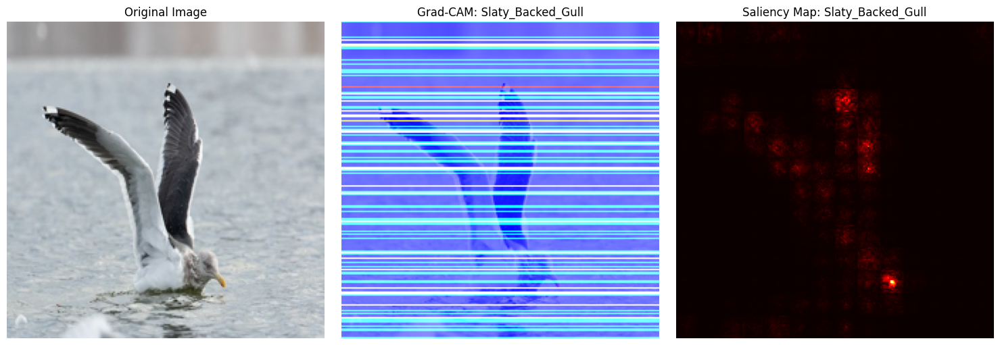

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/480 (9).jpeg


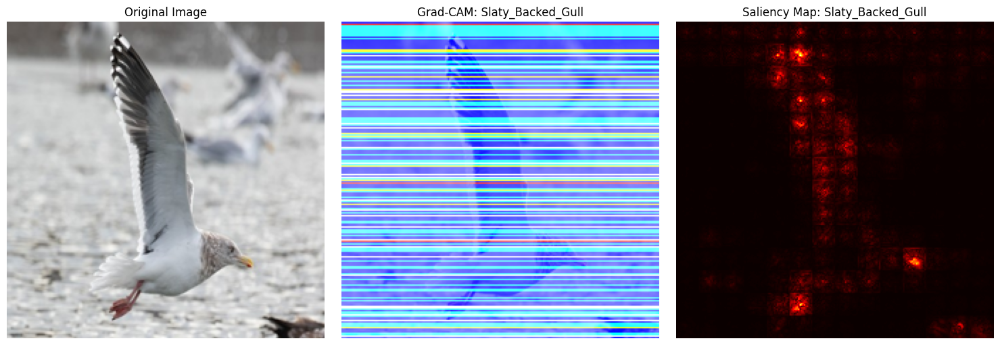

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/480 (53).jpeg


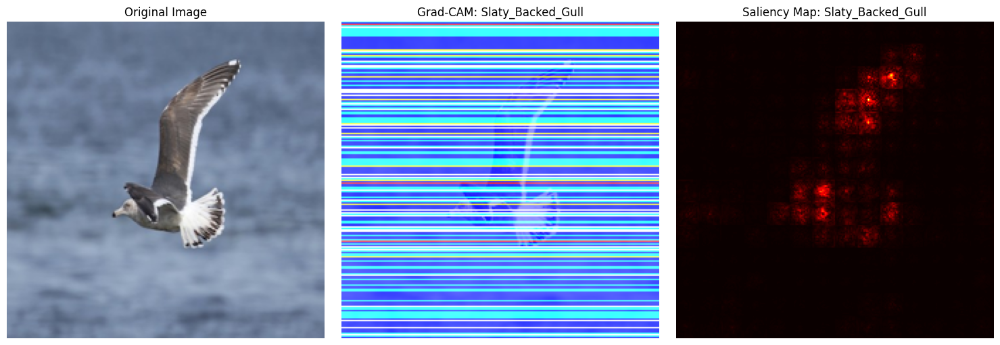

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/480 (29).jpeg


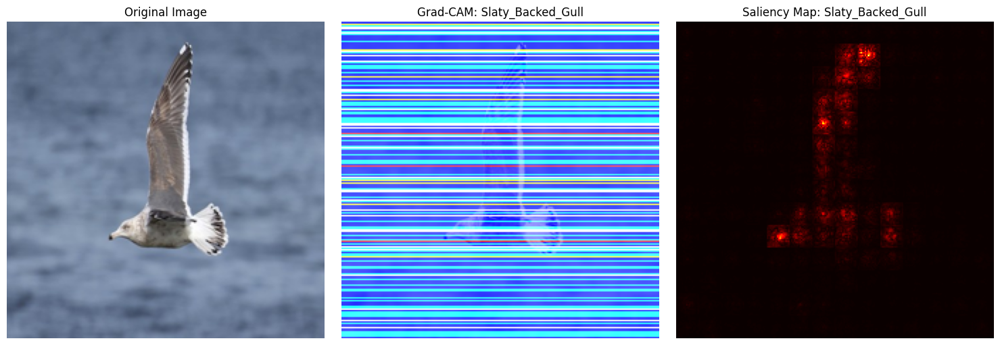

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/480 (19).jpeg


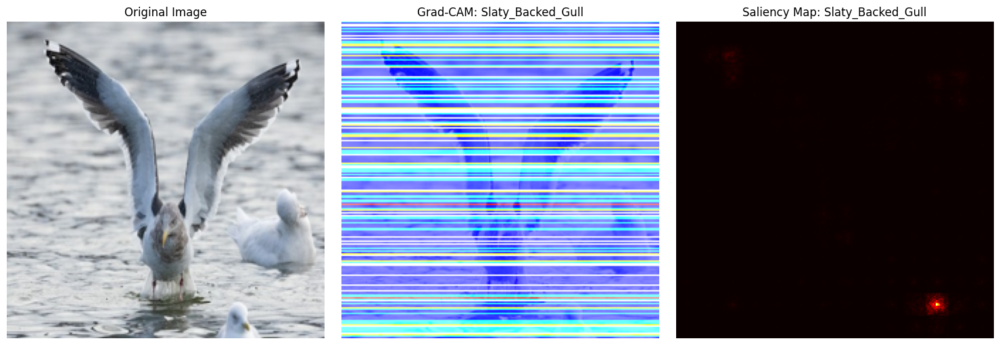

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/480 (21).jpeg


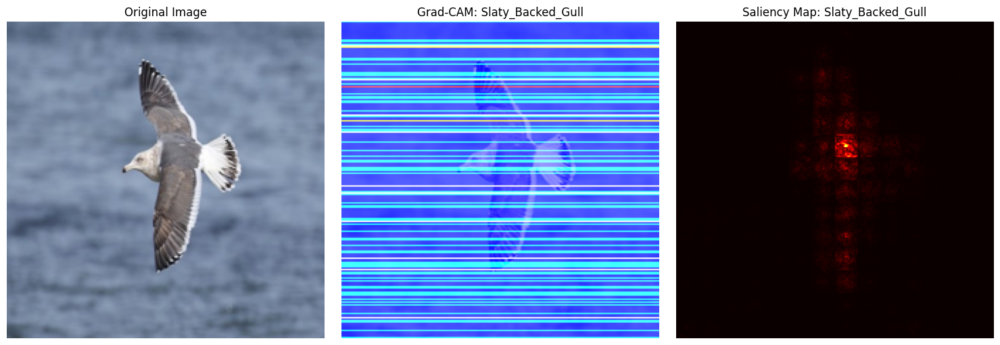

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/480 (33).jpeg


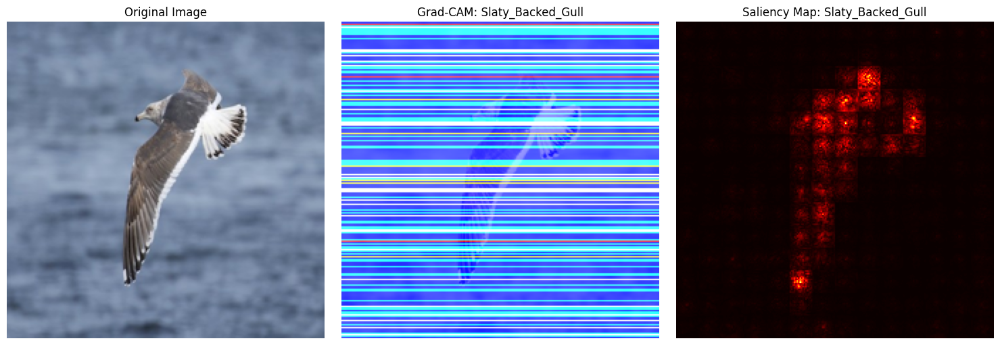

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/480 (6).jpeg


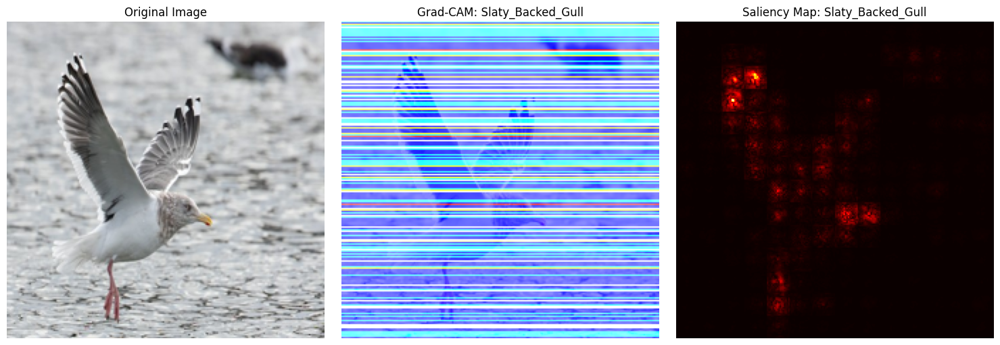

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/011sm.jpg


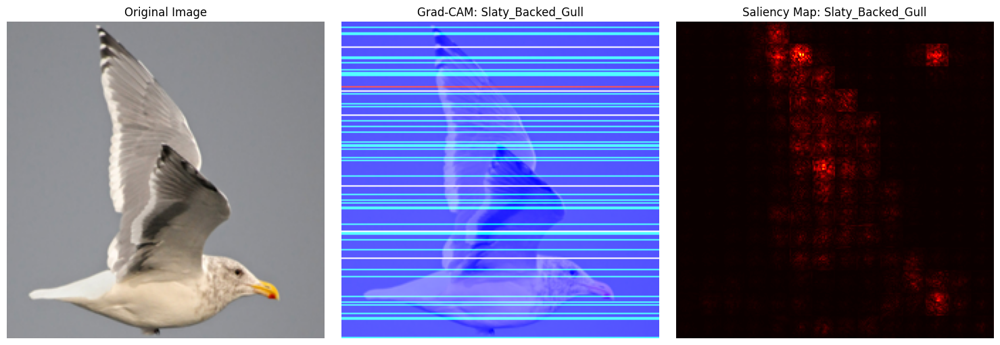

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/480 (45).jpeg


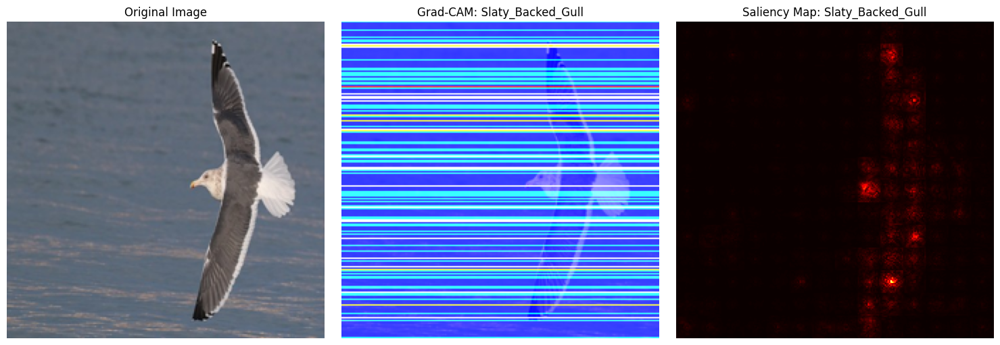

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/480 (40).jpeg


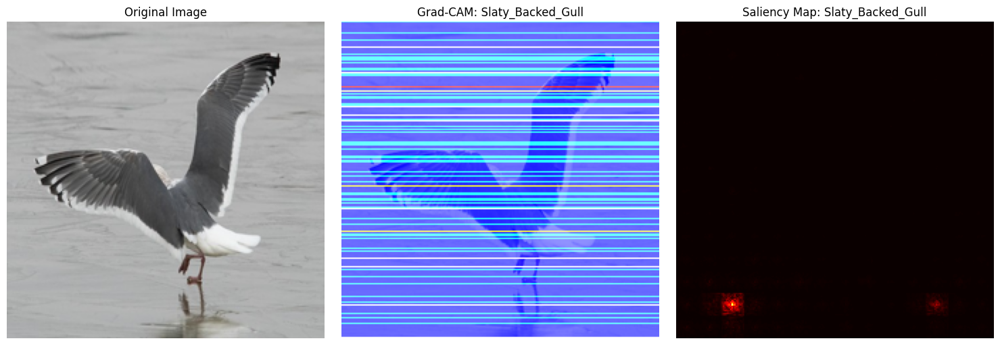

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/480 (7).jpeg


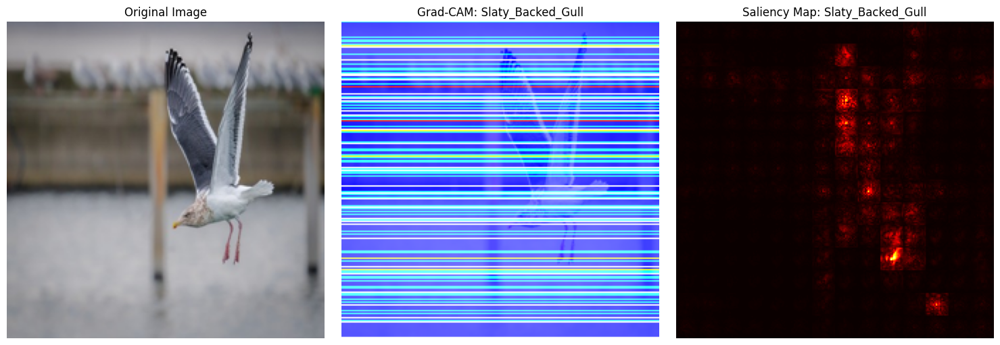

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/480 (54).jpeg


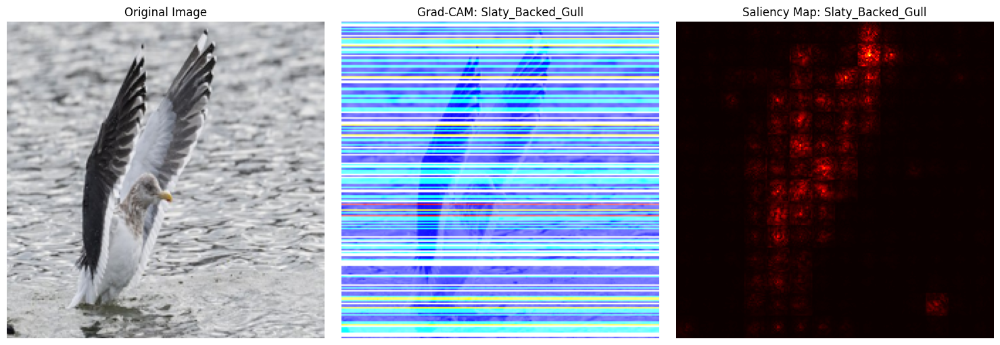

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/480 (41).jpeg


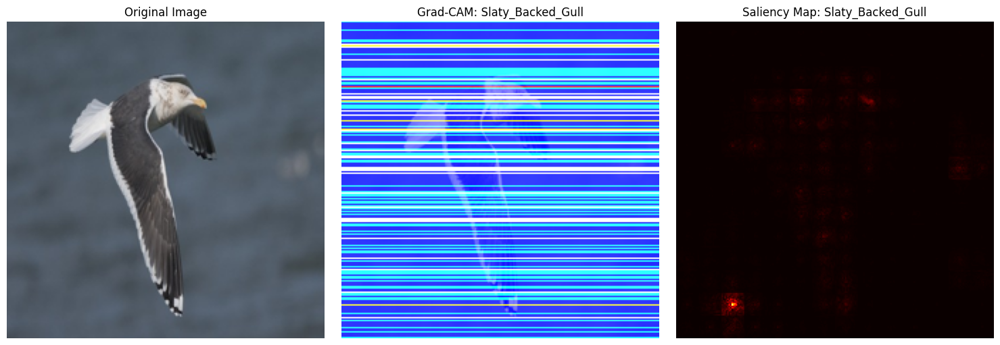

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/480 (15).jpeg


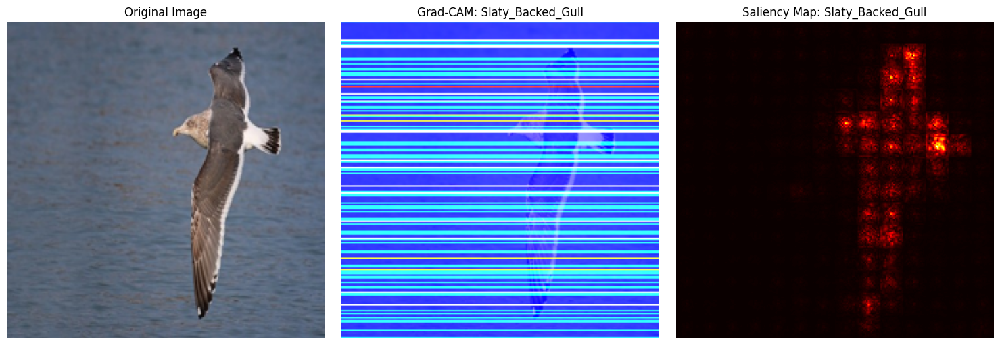

Processing: /content/drive/My Drive/FYP/Dataset/HQ2/test/Slaty_Backed_Gull/480 (1).jpeg


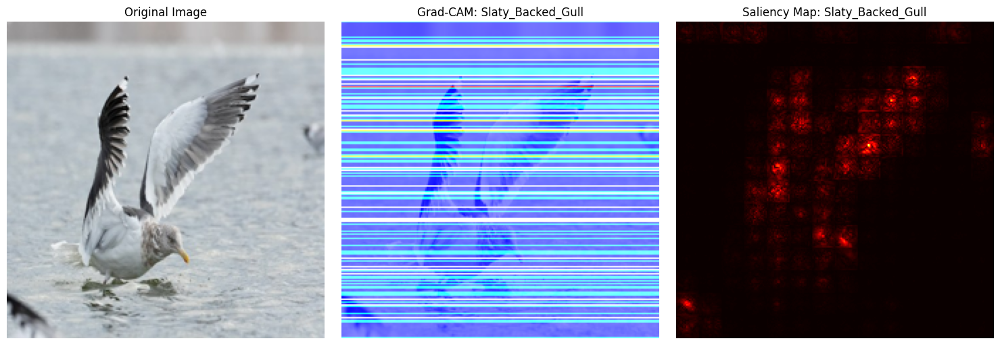

In [7]:
import os
import torch
import torch.nn as nn
from torchvision import transforms, datasets
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import cv2
import timm

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Define model path and dataset path
checkpoint_path = '/content/drive/My Drive/FYP/VIT2_HQ2_20241125/latest_model_vit_20241125.pth'
test_folder_path = '/content/drive/My Drive/FYP/Dataset/HQ2/test'  # Replace with your test folder path

# Define the modified Vision Transformer (ViT) model
class ViTModified(nn.Module):
    def __init__(self):
        super(ViTModified, self).__init__()
        self.vit = timm.create_model('vit_base_patch16_224', pretrained=True)
        num_ftrs = self.vit.head.in_features
        self.vit.head = nn.Linear(num_ftrs, 2)  # Modify the classifier to output 2 classes

    def forward(self, x):
        return self.vit(x)

# Load the trained model
model = ViTModified()
model.load_state_dict(torch.load(checkpoint_path, map_location=torch.device('cpu')))
model.eval()

# Define class names as per dataset
class_names = ['Glaucous_Winged_Gull', 'Slaty_Backed_Gull'] # Adjust based on your class order

# Define image transformation
transform = transforms.Compose([
    transforms.Resize((224, 224)),   # ViT expects 224x224 input size
    transforms.ToTensor(),
    transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5]),
])

# Function to preprocess and load a single image
def preprocess_image(image_path):
    """Load an image and apply transformations."""
    image = Image.open(image_path).convert("RGB")
    image = transform(image)  # Apply transformations
    image = image.unsqueeze(0)  # Add batch dimension
    return image

# Grad-CAM implementation for Vision Transformer
def generate_gradcam_vit(model, image_tensor):
    model.eval()
    features = []
    grads = []

    # Define hooks to capture attention maps and gradients
    def save_features_hook(module, input, output):
        features.append(output)

    def save_grads_hook(module, grad_in, grad_out):
        grads.append(grad_out[0])

    # Register hooks to the attention block
    target_layer = model.vit.blocks[-1].attn
    hook1 = target_layer.register_forward_hook(save_features_hook)
    hook2 = target_layer.register_backward_hook(save_grads_hook)

    # Forward pass
    output = model(image_tensor)
    predicted_class_idx = output.argmax().item()

    # Backward pass to get gradients
    model.zero_grad()
    class_loss = output[0, predicted_class_idx]
    class_loss.backward()

    # Process gradients and attention maps
    gradient = grads[0].cpu().data.numpy()[0]
    feature_map = features[0].cpu().data.numpy()[0]

    # Calculate Grad-CAM
    weights = np.mean(gradient, axis=(1))  # Average over heads
    cam = np.dot(weights, feature_map)  # Weighted combination of attention maps

    cam = np.maximum(cam, 0)  # ReLU to remove negative values
    cam = cv2.resize(cam, (image_tensor.shape[3], image_tensor.shape[2]))  # Resize to match image dimensions
    cam -= np.min(cam)
    cam /= np.max(cam)  # Normalize between 0 and 1
    return cam, predicted_class_idx

# Saliency Map implementation
def generate_saliency_map(model, image_tensor):
    image_tensor.requires_grad_()
    output = model(image_tensor)
    predicted_class_idx = output.argmax().item()

    # Backward pass to calculate gradients
    model.zero_grad()
    output[0, predicted_class_idx].backward()

    # Calculate saliency
    saliency = image_tensor.grad.data.abs()
    saliency, _ = torch.max(saliency, dim=1)  # Take max across channels
    saliency = saliency.squeeze().cpu().numpy()

    # Normalize for visualization
    saliency = (saliency - saliency.min()) / (saliency.max() - saliency.min())
    return saliency, predicted_class_idx

# Function to visualize results
def visualize_results(image_path, gradcam, saliency, predicted_class):
    original_image = Image.open(image_path).resize((224, 224))
    original_image = np.array(original_image)

    # Grad-CAM heatmap overlay
    heatmap = cv2.applyColorMap(np.uint8(255 * gradcam), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    gradcam_image = 0.4 * heatmap + 0.6 * original_image / 255.0

    # Plot images
    plt.figure(figsize=(15, 5))

    # Original Image
    plt.subplot(1, 3, 1)
    plt.title("Original Image")
    plt.imshow(original_image)
    plt.axis('off')

    # Grad-CAM
    plt.subplot(1, 3, 2)
    plt.title(f"Grad-CAM: {class_names[predicted_class]}")
    plt.imshow(gradcam_image)
    plt.axis('off')

    # Saliency Map
    plt.subplot(1, 3, 3)
    plt.title(f"Saliency Map: {class_names[predicted_class]}")
    plt.imshow(saliency, cmap='hot')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# Process all images in the test folder
def process_test_folder(test_folder_path):
    for root, _, files in os.walk(test_folder_path):
        for file in files:
            image_path = os.path.join(root, file)
            print(f"Processing: {image_path}")

            # Preprocess the image
            image_tensor = preprocess_image(image_path)

            # Generate Grad-CAM and Saliency Map
            gradcam, predicted_class_idx_cam = generate_gradcam_vit(model, image_tensor)
            saliency, predicted_class_idx_sal = generate_saliency_map(model, image_tensor)

            # Ensure predictions from both methods match
            assert predicted_class_idx_cam == predicted_class_idx_sal, "Predicted class mismatch!"

            # Visualize results
            visualize_results(image_path, gradcam, saliency, predicted_class_idx_cam)

# Run the combined implementation on all images in the test folder
process_test_folder(test_folder_path)


In [8]:
import os
import torch
import torch.nn as nn
from torchvision import transforms, datasets
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import cv2
import timm

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Define model path and dataset path
checkpoint_path = '/content/drive/My Drive/FYP/VIT2_HQ2_20241125/latest_model_vit_20241125.pth'
test_folder_path = '/content/drive/My Drive/FYP/BOOK_IMAGES_GULL'  # Replace with your test folder path

# Define the modified Vision Transformer (ViT) model
class ViTModified(nn.Module):
    def __init__(self):
        super(ViTModified, self).__init__()
        self.vit = timm.create_model('vit_base_patch16_224', pretrained=True)
        num_ftrs = self.vit.head.in_features
        self.vit.head = nn.Linear(num_ftrs, 2)  # Modify the classifier to output 2 classes

    def forward(self, x):
        return self.vit(x)

# Load the trained model
model = ViTModified()
model.load_state_dict(torch.load(checkpoint_path, map_location=torch.device('cpu')))
model.eval()

# Define class names as per dataset
class_names = ['Glaucous_Winged_Gull', 'Slaty_Backed_Gull'] # Adjust based on your class order

# Define image transformation
transform = transforms.Compose([
    transforms.Resize((224, 224)),   # ViT expects 224x224 input size
    transforms.ToTensor(),
    transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5]),
])

# Function to preprocess and load a single image
def preprocess_image(image_path):
    """Load an image and apply transformations."""
    image = Image.open(image_path).convert("RGB")
    image = transform(image)  # Apply transformations
    image = image.unsqueeze(0)  # Add batch dimension
    return image

# Grad-CAM implementation for Vision Transformer
def generate_gradcam_vit(model, image_tensor):
    model.eval()
    features = []
    grads = []

    # Define hooks to capture attention maps and gradients
    def save_features_hook(module, input, output):
        features.append(output)

    def save_grads_hook(module, grad_in, grad_out):
        grads.append(grad_out[0])

    # Register hooks to the attention block
    target_layer = model.vit.blocks[-1].attn
    hook1 = target_layer.register_forward_hook(save_features_hook)
    hook2 = target_layer.register_backward_hook(save_grads_hook)

    # Forward pass
    output = model(image_tensor)
    predicted_class_idx = output.argmax().item()

    # Backward pass to get gradients
    model.zero_grad()
    class_loss = output[0, predicted_class_idx]
    class_loss.backward()

    # Process gradients and attention maps
    gradient = grads[0].cpu().data.numpy()[0]
    feature_map = features[0].cpu().data.numpy()[0]

    # Calculate Grad-CAM
    weights = np.mean(gradient, axis=(1))  # Average over heads
    cam = np.dot(weights, feature_map)  # Weighted combination of attention maps

    cam = np.maximum(cam, 0)  # ReLU to remove negative values
    cam = cv2.resize(cam, (image_tensor.shape[3], image_tensor.shape[2]))  # Resize to match image dimensions
    cam -= np.min(cam)
    cam /= np.max(cam)  # Normalize between 0 and 1
    return cam, predicted_class_idx

# Saliency Map implementation
def generate_saliency_map(model, image_tensor):
    image_tensor.requires_grad_()
    output = model(image_tensor)
    predicted_class_idx = output.argmax().item()

    # Backward pass to calculate gradients
    model.zero_grad()
    output[0, predicted_class_idx].backward()

    # Calculate saliency
    saliency = image_tensor.grad.data.abs()
    saliency, _ = torch.max(saliency, dim=1)  # Take max across channels
    saliency = saliency.squeeze().cpu().numpy()

    # Normalize for visualization
    saliency = (saliency - saliency.min()) / (saliency.max() - saliency.min())
    return saliency, predicted_class_idx

# Function to visualize results
def visualize_results(image_path, gradcam, saliency, predicted_class):
    original_image = Image.open(image_path).resize((224, 224))
    original_image = np.array(original_image)

    # Grad-CAM heatmap overlay
    heatmap = cv2.applyColorMap(np.uint8(255 * gradcam), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    gradcam_image = 0.4 * heatmap + 0.6 * original_image / 255.0

    # Plot images
    plt.figure(figsize=(15, 5))

    # Original Image
    plt.subplot(1, 3, 1)
    plt.title("Original Image")
    plt.imshow(original_image)
    plt.axis('off')

    # Grad-CAM
    plt.subplot(1, 3, 2)
    plt.title(f"Grad-CAM: {class_names[predicted_class]}")
    plt.imshow(gradcam_image)
    plt.axis('off')

    # Saliency Map
    plt.subplot(1, 3, 3)
    plt.title(f"Saliency Map: {class_names[predicted_class]}")
    plt.imshow(saliency, cmap='hot')
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# Process all images in the test folder
def process_test_folder(test_folder_path):
    for root, _, files in os.walk(test_folder_path):
        for file in files:
            image_path = os.path.join(root, file)
            print(f"Processing: {image_path}")

            # Preprocess the image
            image_tensor = preprocess_image(image_path)

            # Generate Grad-CAM and Saliency Map
            gradcam, predicted_class_idx_cam = generate_gradcam_vit(model, image_tensor)
            saliency, predicted_class_idx_sal = generate_saliency_map(model, image_tensor)

            # Ensure predictions from both methods match
            assert predicted_class_idx_cam == predicted_class_idx_sal, "Predicted class mismatch!"

            # Visualize results
            visualize_results(image_path, gradcam, saliency, predicted_class_idx_cam)

# Run the combined implementation on all images in the test folder
process_test_folder(test_folder_path)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


<ipython-input-8-a6422f2c7bf3>:32: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(checkpoint_path, map_location=torch.device('cpu')))
